In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import PIL
from PIL import Image

videoCapture=cv2.VideoCapture('blade_runner_2049.mp4')

In [31]:
if videoCapture.isOpened():
    ret,frame=videoCapture.read()
else:
    ret=False

In [32]:
i=1
timeF=24
while ret:
    ret,frame=videoCapture.read()
    if i%timeF==0:
        path='img/'+str(int(i/24))+'.jpg'
        cv2.imwrite(path,frame)
    i=i+1
print(i)
videoCapture.release()

235126


In [4]:
def average_color(path):
    img=Image.open(path)
    img = cv2.cvtColor(np.asarray(img),cv2.COLOR_RGB2BGR)  
    average=img.mean(axis=0).mean(axis=0)
    b=average[0]/255
    g=average[1]/255
    r=average[2]/255
    r=round(r,2)
    g=round(g,2)
    b=round(b,2)
    color=(r,g,b)
    return color

In [34]:
path='img/'+str(1)+'.jpg'
color=average_color(path)

In [5]:
colorlist=[]
for i in range(9231):
    k=i+1
    path='img/'+str(k)+'.jpg'
    color=average_color(path)
    colorlist.append(color)

In [86]:
L=list(set(colorlist))
L=sorted(L,reverse=False,key=tuple)

print(len(L))

2020


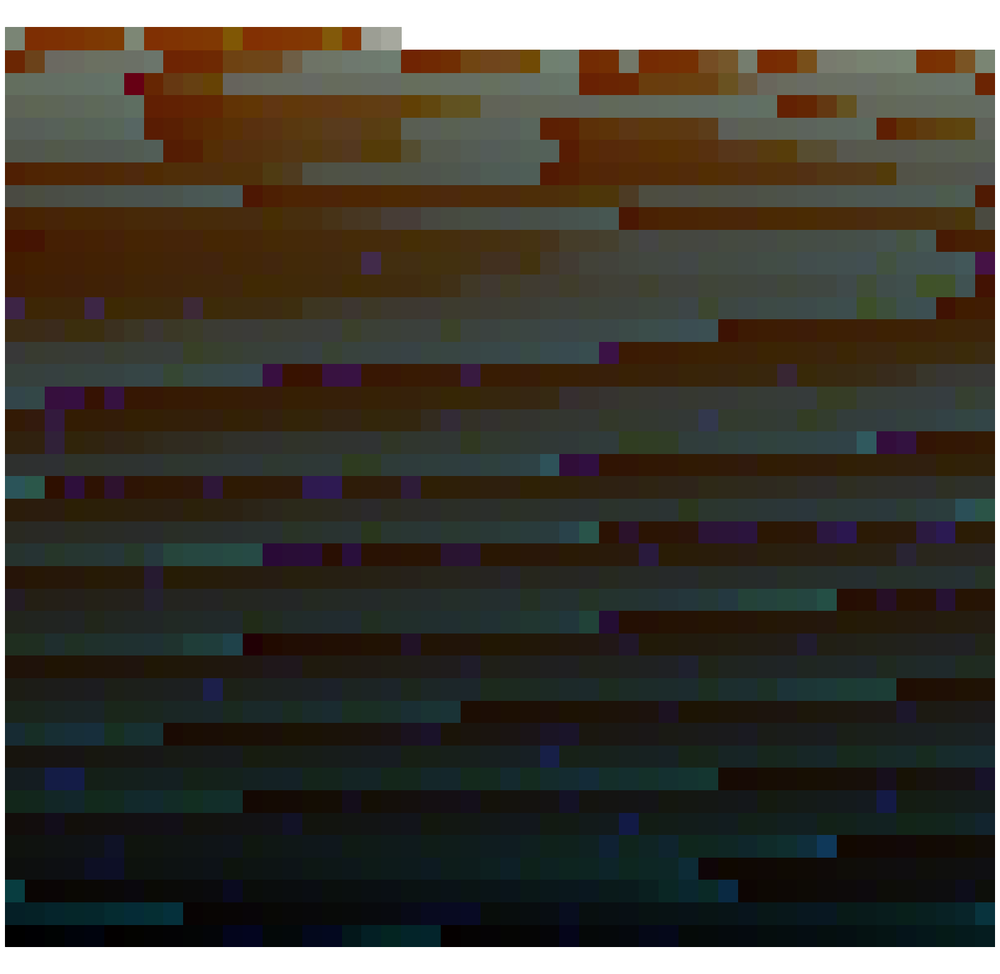

In [98]:
#色卡
fig=plt.figure(figsize=(25,25))
ax1=fig.add_subplot()
plt.xlim(0,100)
plt.ylim(0,430)
plt.axis('off')
w=2

n=len(L)
y=0
for i in range (n):
    if i%50==0:
        y=y+10
    else:
        y=y
    x=(i%50)*w
    ax1.add_patch(
        patches.Rectangle(
            (x,y),
            w,
            10,
            color=L[i]
        )
    )
plt.savefig('colorboard')
plt.show()

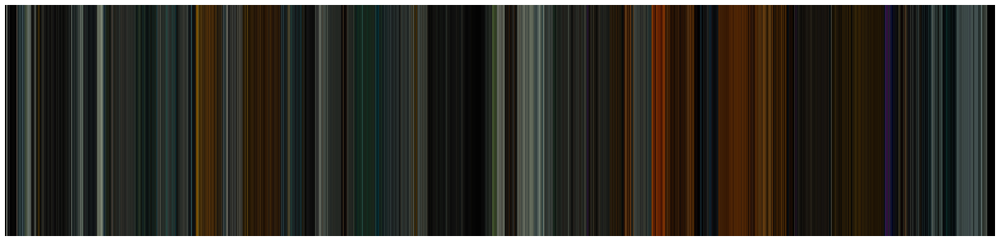

In [39]:
fig=plt.figure(figsize=(25,6))
ax1=fig.add_subplot()
plt.xlim(0,9231)
plt.ylim(0,100)
plt.axis('off')
w=1

n=len(colorlist)
for i in range (n):
    ax1.add_patch(
        patches.Rectangle(
            (w*i,0),
            w,
            100,
            color=colorlist[i]
        )
    )
plt.savefig('output')
plt.show()

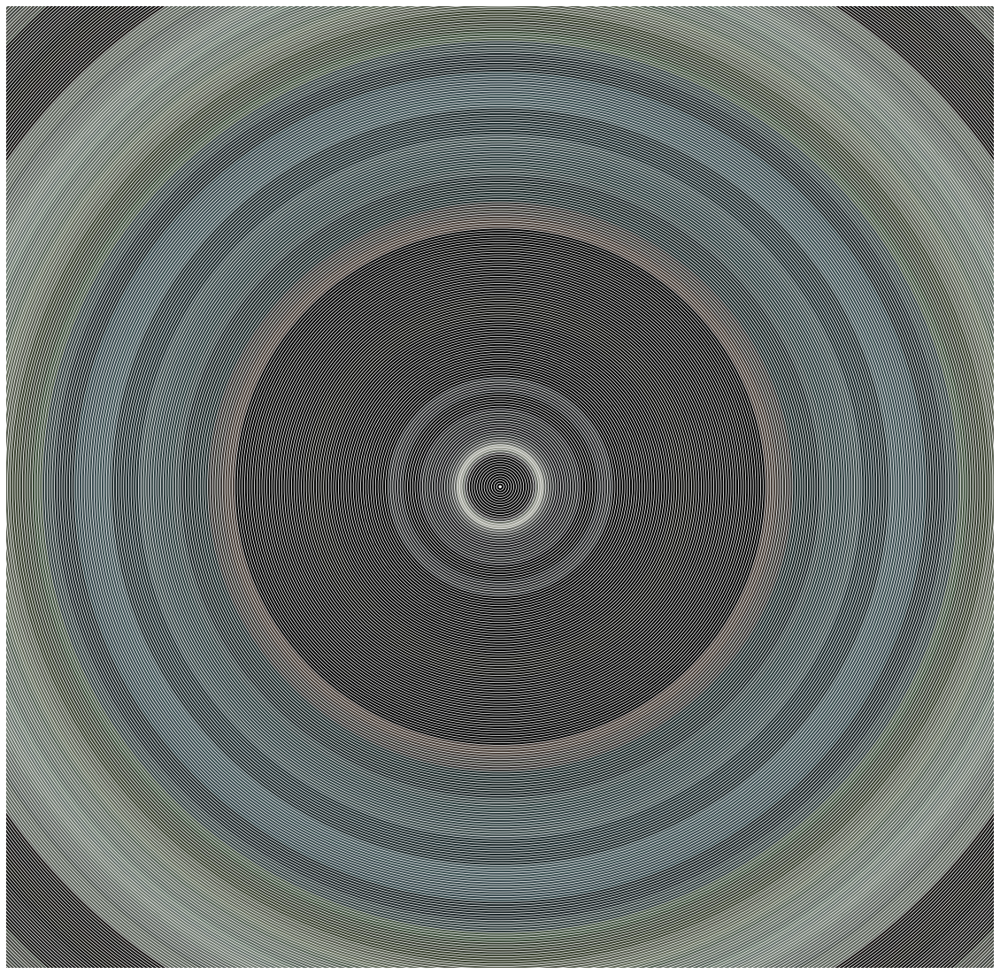

In [31]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
fig=plt.figure(figsize=(20,20))
ax1=fig.add_subplot()
plt.xlim(-100,100)
plt.ylim(-100,100)
plt.axis('off')

n=len(colorlist)
for i in range (n):
    r=i+1
    color=colorlist[i]
    cir=Ellipse(xy=(0,0),width=r,height=r,facecolor='None',edgecolor=color,linewidth=2)
    ax1.add_patch(cir)
plt.savefig('output_circle4')
plt.show()